# <font color='red'>House Price Prediction in King County, Washington State, USA
Online property companies offer valuations of houses using machine learning techniques. The aim of this report is to predict the house sales in **King County, Washington State, USA** using **Multiple Linear Regression (MLR)**. The dataset consists of historical data of houses sold between May 2014 to May 2015. 

Our objective is to predict the sales prices of houses in King County with an accuracy of at least **75-80%** and to understand which factors contribute to higher property values, specifically those priced at **$650,000 and above**.

The dataset consists of house prices from **King County**, an area in the U.S. State of Washington, and also covers **Seattle**. The dataset was obtained from **Kaggle** and was published under the **CC0: Public Domain** license. Unfortunately, the user who provided the data on Kaggle did not indicate the original source of the data. Further details on the citation and database description can be found in the **Glossary and Bibliography** sections of this report.

The dataset contains **21 variables** and **21,613 observations**.


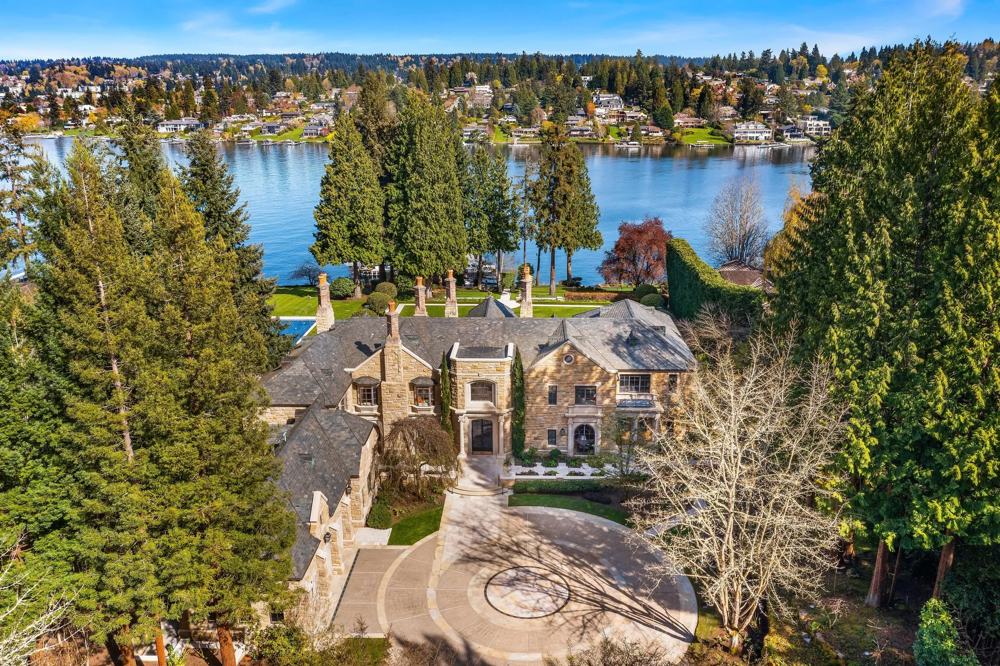

# <font color='red'>Requirements

In [4]:
import pandas as pd
import numpy as np
pd.set_option('display.max_columns',55)

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import RandomForestRegressor

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.linear_model import Ridge, Lasso,ElasticNet

In [5]:
df=pd.read_csv('kc_house_data.csv')

In [6]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


# <font color='red'>EDA (Exploratory Data Analysis)

In [8]:
df.head(1)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.0,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650


In [9]:
df.sample(3)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
6386,8850000285,20140612T000000,350000.0,4,2.25,2300,4600,1.5,0,0,4,7,1340,960,1904,0,98144,47.5895,-122.311,1540,3000
258,9407100800,20141124T000000,255000.0,3,1.00,1230,10170,1.0,0,0,3,7,1230,0,1979,0,98045,47.4437,-121.772,1380,10098
31,2426039314,20141201T000000,280000.0,2,1.50,1190,1265,3.0,0,0,3,7,1190,0,2005,0,98133,47.7274,-122.357,1390,1756


In [10]:
df.tail()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
21608,263000018,20140521T000000,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21609,6600060120,20150223T000000,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21610,1523300141,20140623T000000,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21611,291310100,20150116T000000,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287
21612,1523300157,20141015T000000,325000.0,2,0.75,1020,1076,2.0,0,0,3,7,1020,0,2008,0,98144,47.5941,-122.299,1020,1357


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [12]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [13]:
df.corr(numeric_only=True)

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
id,1.000000,-0.016762,0.001286,0.005160,-0.012258,-0.132109,0.018525,-0.002721,0.011592,-0.023783,0.008130,-0.010842,-0.005151,0.021380,-0.016907,-0.008224,-0.001891,0.020799,-0.002901,-0.138798
price,-0.016762,1.000000,0.308350,0.525138,0.702035,0.089661,0.256794,0.266369,0.397293,0.036362,0.667434,0.605567,0.323816,0.054012,0.126434,-0.053203,0.307003,0.021626,0.585379,0.082447
bedrooms,0.001286,0.308350,1.000000,0.515884,0.576671,0.031703,0.175429,-0.006582,0.079532,0.028472,0.356967,0.477600,0.303093,0.154178,0.018841,-0.152668,-0.008931,0.129473,0.391638,0.029244
bathrooms,0.005160,0.525138,0.515884,1.000000,0.754665,0.087740,0.500653,0.063744,0.187737,-0.124982,0.664983,0.685342,0.283770,0.506019,0.050739,-0.203866,0.024573,0.223042,0.568634,0.087175
sqft_living,-0.012258,0.702035,0.576671,0.754665,1.000000,0.172826,0.353949,0.103818,0.284611,-0.058753,0.762704,0.876597,0.435043,0.318049,0.055363,-0.199430,0.052529,0.240223,0.756420,0.183286
sqft_lot,-0.132109,0.089661,0.031703,0.087740,0.172826,1.000000,-0.005201,0.021604,0.074710,-0.008958,0.113621,0.183512,0.015286,0.053080,0.007644,-0.129574,-0.085683,0.229521,0.144608,0.718557
floors,0.018525,0.256794,0.175429,0.500653,0.353949,-0.005201,1.000000,0.023698,0.029444,-0.263768,0.458183,0.523885,-0.245705,0.489319,0.006338,-0.059121,0.049614,0.125419,0.279885,-0.011269
waterfront,-0.002721,0.266369,-0.006582,0.063744,0.103818,0.021604,0.023698,1.000000,0.401857,0.016653,0.082775,0.072075,0.080588,-0.026161,0.092885,0.030285,-0.014274,-0.041910,0.086463,0.030703
view,0.011592,0.397293,0.079532,0.187737,0.284611,0.074710,0.029444,0.401857,1.000000,0.045990,0.251321,0.167649,0.276947,-0.053440,0.103917,0.084827,0.006157,-0.078400,0.280439,0.072575
condition,-0.023783,0.036362,0.028472,-0.124982,-0.058753,-0.008958,-0.263768,0.016653,0.045990,1.000000,-0.144674,-0.158214,0.174105,-0.361417,-0.060618,0.003026,-0.014941,-0.106500,-0.092824,-0.003406


In [14]:
df['price'].mean(),df['price'].median(),df['price'].min(),df['price'].max(),df['price'].std()

(540088.1417665294, 450000.0, 75000.0, 7700000.0, 367127.1964826997)

In [15]:
df['price'].describe()

count    2.161300e+04
mean     5.400881e+05
std      3.671272e+05
min      7.500000e+04
25%      3.219500e+05
50%      4.500000e+05
75%      6.450000e+05
max      7.700000e+06
Name: price, dtype: float64

In [16]:
df.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [17]:
df['zipcode'].unique()

array([98178, 98125, 98028, 98136, 98074, 98053, 98003, 98198, 98146,
       98038, 98007, 98115, 98107, 98126, 98019, 98103, 98002, 98133,
       98040, 98092, 98030, 98119, 98112, 98052, 98027, 98117, 98058,
       98001, 98056, 98166, 98023, 98070, 98148, 98105, 98042, 98008,
       98059, 98122, 98144, 98004, 98005, 98034, 98075, 98116, 98010,
       98118, 98199, 98032, 98045, 98102, 98077, 98108, 98168, 98177,
       98065, 98029, 98006, 98109, 98022, 98033, 98155, 98024, 98011,
       98031, 98106, 98072, 98188, 98014, 98055, 98039], dtype=int64)

In [18]:
df['zipcode'].value_counts()

zipcode
98103    602
98038    590
98115    583
98052    574
98117    553
        ... 
98102    105
98010    100
98024     81
98148     57
98039     50
Name: count, Length: 70, dtype: int64

# <font color='red'>Data Visualization

In [20]:
px.box(df, x="view", y="price", width=900, height=600)

In [21]:
px.box(df, x="waterfront", y="price", width=900, height=600)

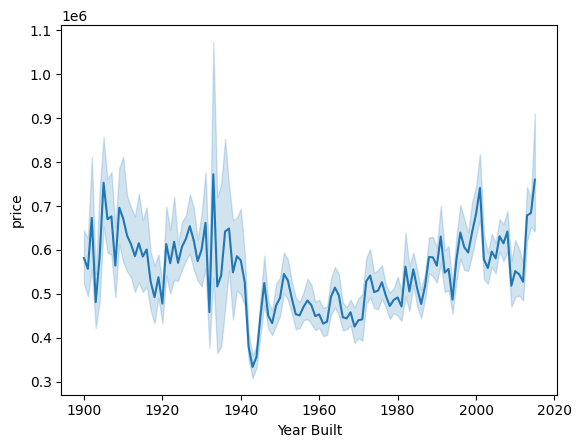

In [22]:
sns.lineplot(data=df, x="yr_built", y="price")
plt.xlabel('Year Built');

In [23]:
px.sunburst(df, path=['bedrooms', 'bathrooms'], values='price')

In [24]:
fig=px.bar(df, x='floors', y='price')
fig.update_layout(plot_bgcolor="lightpink")

# <font color='red'>Feature Engineering

In [26]:
df['age']=2024-df['yr_built']

In [27]:
df['zipcode']=df['zipcode'].astype('category')

In [28]:
df['sqft_total']=df['sqft_above']+df['sqft_basement']

In [29]:
df['is_renovated']=np.where(df['yr_renovated']>0,1,0)

In [30]:
df_copy=df.copy()

In [31]:
df.describe([0.25,0.50,0.99])['price']

count    2.161300e+04
mean     5.400881e+05
std      3.671272e+05
min      7.500000e+04
25%      3.219500e+05
50%      4.500000e+05
99%      1.964400e+06
max      7.700000e+06
Name: price, dtype: float64

In [32]:
df=df[df['price']<=1.964650e+06]

In [33]:
df.describe([0.25,0.50,0.99])['bedrooms']

count    21396.000000
mean         3.360909
std          0.923862
min          0.000000
25%          3.000000
50%          3.000000
99%          6.000000
max         33.000000
Name: bedrooms, dtype: float64

In [34]:
df=df[df['bedrooms']<=10]

In [35]:
df.describe([0.25,0.50,0.99])['sqft_above']

count    21394.000000
mean      1766.214593
std        791.602241
min        290.000000
25%       1190.000000
50%       1550.000000
99%       4170.700000
max       7420.000000
Name: sqft_above, dtype: float64

In [36]:
df=df[df['sqft_above']<=5000.7]

In [37]:
df.describe([0.25,0.50,0.99])['sqft_living15']

count    21342.000000
mean      1967.245478
std        660.873583
min        399.000000
25%       1480.000000
50%       1830.000000
99%       3930.000000
max       5790.000000
Name: sqft_living15, dtype: float64

In [38]:
df=df[df['sqft_living15']<=4000]

In [39]:
df.describe([0.25,0.50,0.99])['sqft_basement']

count    21162.000000
mean       281.508270
std        424.814011
min          0.000000
25%          0.000000
50%          0.000000
99%       1580.000000
max       2850.000000
Name: sqft_basement, dtype: float64

In [40]:
df=df[df['sqft_basement']<=2000]

In [41]:
df['sqft_per_floor'] = df['sqft_living'] / df['floors']

In [42]:
df['sale_year'] = pd.to_datetime(df['date']).dt.year

In [43]:
df['sale_month'] = pd.to_datetime(df['date']).dt.month

In [44]:
df['has_basement']=np.where(df['sqft_basement']>0,1,0)

In [45]:
df['is_viewed']=np.where(df['view']>0,1,0)
df=df.drop('view',axis=1)

In [46]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,age,sqft_total,is_renovated,sqft_per_floor,sale_year,sale_month,has_basement,is_viewed
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,69,1180,0,1180.0,2014,10,0,0
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,73,2570,1,1285.0,2014,12,1,0
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,91,770,0,770.0,2015,2,0,0
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,59,1960,0,1960.0,2014,12,1,0
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,37,1680,0,1680.0,2015,2,0,0


# <font color='red'>Model

In [48]:
abs(df.corr(numeric_only=True)['price'].sort_values(ascending=False))

price             1.000000
grade             0.655208
sqft_living       0.651154
sqft_total        0.651154
sqft_living15     0.567216
sqft_above        0.549430
bathrooms         0.477938
lat               0.378109
sqft_per_floor    0.358151
is_viewed         0.313134
bedrooms          0.305876
floors            0.273050
sqft_basement     0.272076
has_basement      0.181748
waterfront        0.151193
yr_renovated      0.129420
is_renovated      0.128993
sqft_lot          0.076724
sqft_lot15        0.062742
condition         0.048200
yr_built          0.041464
long              0.016673
sale_year         0.007690
id                0.006977
sale_month        0.015937
age               0.041464
Name: price, dtype: float64

In [49]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'age', 'sqft_total', 'is_renovated',
       'sqft_per_floor', 'sale_year', 'sale_month', 'has_basement',
       'is_viewed'],
      dtype='object')

In [50]:
x=df[['sqft_living','grade','sqft_above','sqft_living15','bathrooms','is_viewed','sqft_basement'
      ,'bedrooms','lat','waterfront','floors','age','zipcode','sqft_total','is_renovated','sqft_per_floor','sale_year','sale_month','has_basement']]
y=df[['price']]

In [51]:
x.shape

(21117, 19)

## <font color='red'> Linear Regression

In [52]:
lr=LinearRegression()

In [53]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [54]:
model=lr.fit(x_train,y_train) 

In [55]:
tahmin=model.predict(x_test)

In [56]:
mean_squared_error(y_test,tahmin) ** 0.5

148622.94757624227

In [57]:
r2_score(y_test,tahmin)

0.6856378338848761

## <font color='red'> Ridge, Lasso, ElasticNet

In [60]:
R=Ridge()
L=Lasso()
E=ElasticNet()

In [61]:
Rmodel=R.fit(x_train,y_train)

In [62]:
Rtahmin=Rmodel.predict(x_test)

In [63]:
mean_squared_error(y_test,Rtahmin) ** 0.5

148630.73303440353

In [64]:
r2_score(y_test,Rtahmin)

0.6856048979535769

In [65]:
Lmodel=L.fit(x_train,y_train)

C:\Users\MONSTER\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.007e+13, tolerance: 1.265e+11



In [66]:
Ltahmin=Lmodel.predict(x_test)

In [67]:
mean_squared_error(y_test,Ltahmin) **0.5

148622.98193569505

In [68]:
r2_score(y_test,Ltahmin)

0.6856376885329849

In [69]:
Emodel=E.fit(x_train,y_train)

C:\Users\MONSTER\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.776e+14, tolerance: 1.265e+11



In [70]:
Etahmin=Emodel.predict(x_test)

In [71]:
mean_squared_error(y_test,Etahmin)**0.5

174008.14885950185

In [72]:
r2_score(y_test,Etahmin)

0.5690789533875195

## <font color='red'> Decision Tree Regressor

In [74]:
dt=DecisionTreeRegressor()

In [75]:
Dmodel=dt.fit(x_train,y_train)

In [76]:
Dtahmin=Dmodel.predict(x_test)

In [77]:
mean_squared_error(y_test,Dtahmin) ** 0.5 # Hatanin daha yuksek ciktigi icin r2'nin daha az cikmasini bekliyoruz

150958.94975369587

In [78]:
r2_score(y_test,Dtahmin)

0.675678108995799

## <font color='red'>Extra Tree Regressor

In [80]:
ET=ExtraTreesRegressor()

In [81]:
ETmodel=ET.fit(x_train,y_train)

C:\Users\MONSTER\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:1473: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [82]:
ETtahmin=ETmodel.predict(x_test)

In [83]:
mean_squared_error(y_test,ETtahmin)**0.5

107249.65028311286

In [84]:
r2_score(y_test,ETtahmin)

0.8362993885428538

## <font color='red'>XGBoost

In [86]:
# pip install xgboost

In [204]:
import xgboost as xgb
X_train, X_test, y_train, y_test = train_test_split(x, y,test_size=0.2,random_state=42)
Model_XGB_REG = xgb.XGBRegressor(enable_categorical=True)
Model_XGB_REG.fit(X_train,y_train)
y_predict = Model_XGB_REG.predict(X_test)

In [206]:
r2_score(y_test, y_predict)

0.8595238924026489

mean_squared_error(y_test, y_predict)**0.5

## <font color='red'> Random Forest Regressor

In [198]:
reg = RandomForestRegressor()
Regmodel=reg.fit(x_train, y_train)
y_pred = Regmodel.predict(x_train)

C:\Users\MONSTER\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:1473: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [199]:
r2_score(y_train, y_pred)

0.9790529394334923

In [200]:
mean_squared_error(y_train, y_pred)**0.5

39607.35468150079

| Model                     | R² Score | Mean Squared Error (MSE) |
|---------------------------|----------|----------------------------|
| Linear Regression         | 0.69     | 148,622                    |
| Ridge                     | 0.69     | 148,630                    |
| Lasso                     | 0.69     | 148,622                    |
| ElasticNet                | 0.57     | 174,008                    |
| Decision Tree Regressor   | 0.68     | 150,958                    |
| Extra Tree Regressor      | 0.68     | 107,249                    |
| XGBoost                   | 0.86     | 99,350                     |
| Random Forest Regressor   | 0.98     | 39,980                     |


# <font color='red'>Model Performance Summary

Based on the evaluation of various regression models, we observe that the **Random Forest Regressor** achieved the highest \( R^2 \) score of 0.98 and the lowest Mean Squared Error (MSE) of 39,980, indicating it has the best predictive performance and accuracy among the models tested. **XGBoost** also performed well, with an \( R^2 \) score of 0.86 and an MSE of 99,350, making it a strong alternative, particularly if interpretability and computational efficiency are desired.

Traditional linear models, including **Linear Regression**, **Ridge**, and **Lasso**, all yielded similar results with an \( R^2 \) score of 0.69 and an MSE around 148,622, showing reasonable but lower performance. **ElasticNet** had a lower \( R^2 \) score of 0.57 and the highest MSE at 174,008, suggesting it may not be the best fit for this dataset. Meanwhile, **Decision Tree** and **Extra Tree Regressors** performed moderately, with \( R^2 \) scores around 0.68 and MSE values of 150,958 and 107,249, respectively.

In summary, the **Random Forest Regressor** is the most suitable model for this dataset, with **XGBoost** as a close contender, providing a good balance of accuracy and computational cost.
